In [7]:
import pymongo as pm
import ssl, certifi
from datetime import datetime, timedelta, timezone
import numpy as np
import matplotlib.pyplot as plt

In [2]:
USER = "ictts"
PWD  = "Ict4SM22!"
HOST = "bigdatadb.polito.it"
PORT = 27017
DB   = "carsharing"

client = pm.MongoClient('bigdatadb.polito.it',
ssl=True, #there might be conflicts, try to set to False
authSource = 'carsharing',
username = 'ictts',
password ='Ict4SM22!',
tlsAllowInvalidCertificates=True)

db = client[DB]
db.list_collection_names()

ServerSelectionTimeoutError: bigdatadb.polito.it:27017: timed out, Timeout: 30s, Topology Description: <TopologyDescription id: 6916045c0867ce04b7d63b02, topology_type: Single, servers: [<ServerDescription ('bigdatadb.polito.it', 27017) server_type: Unknown, rtt: None, error=NetworkTimeout('bigdatadb.polito.it:27017: timed out')>]>

In [11]:
# list of collections in the database

collections = [
    "ActiveBookings", "ActiveParkings", "PermanentBookings", "PermanentParkings",
    "enjoy_ActiveBookings", "enjoy_ActiveParkings", "enjoy_PermanentBookings", "enjoy_PermanentParkings"
]

**Step 1 - Preliminary data analysis**

How many documents are present in each collection?

In [10]:
# count documents in each collection 

for collection in collections :
    count = db[collection].count_documents({})
    print(f"{collection}: {count}")

ActiveBookings: 8743
ActiveParkings: 4790
PermanentBookings: 28180508
PermanentParkings: 28312676
enjoy_ActiveBookings: 0
enjoy_ActiveParkings: 0
enjoy_PermanentBookings: 6653472
enjoy_PermanentParkings: 6689979


Why the number of documents in PermanentParkings and PermanentBooking is similar?

They are similar because each time a car is booked, at the end it will be parked in a parking slot and the counter of how many cars have been parked will increase by one. However, there could be cases in which the user decides to cancel the booking, and the system will consider the car as parked again in the same spot, for this reason the number of bookings could be slightly lower than the number of parkings.

For which cities the system is collecting data?

In [11]:
# for which cities the system is collecting data ?

# extract distinct cities from both car2go and enjoy permanent bookings
cities_c2go = db["PermanentBookings"].distinct("city")
cities_enjoy = db["enjoy_PermanentBookings"].distinct("city")

print(f"car2go: {cities_c2go}")
print(f"enjoy: {cities_enjoy}")

car2go: ['Wien', 'Washington DC', 'Vancouver', 'Twin Cities', 'Toronto', 'Torino', 'Stuttgart', 'Seattle', 'San Diego', 'Roma', 'Rheinland', 'Portland', 'New York City', 'Munchen', 'Montreal', 'Milano', 'Madrid', 'Hamburg', 'Frankfurt', 'Firenze', 'Denver', 'Columbus', 'Calgary', 'Berlin', 'Austin', 'Amsterdam']
enjoy: ['Bologna', 'Catania', 'Firenze', 'Milano', 'Roma', 'Torino']


When did each collection start? When did each collection end?

In [12]:
def get_start_and_end_dates(collection_name):
    # the query aggregates the collection according to min and max dates and returns them
    result = db[collection_name].aggregate([
        {
            "$group": {
                "_id": None,
                "start": {"$min": "$init_time"},
                "end": {"$max": "$final_time"}
            }
        },
        {
            "$project": {
                "_id": 0,   # hide the _id field
                "start": 1, # show the start field
                "end": 1    # show the end field
            }
        }
    ])
    doc = next(result, {})
    
    return doc.get("start"), doc.get("end")

# for each collection, get the start and end dates
for collection in collections:
    start, end = get_start_and_end_dates(collection)
    # convert timestamps to datetime utc +1 (torino timezone)
    if start:
        start = datetime.fromtimestamp(start, tz=timezone.utc) + timedelta(hours=1)
    if end:
        end = datetime.fromtimestamp(end, tz=timezone.utc) + timedelta(hours=1)
    print(f"{collection}-start: {start}, End:{end}")

ActiveBookings-start: 2017-12-11 14:45:38+00:00, End:1970-01-01 00:59:59+00:00
ActiveParkings-start: 2018-01-24 06:56:00+00:00, End:1970-01-01 00:59:59+00:00
PermanentBookings-start: 2016-12-13 18:38:23+00:00, End:2018-01-31 14:13:03+00:00
PermanentParkings-start: 2016-12-13 18:37:38+00:00, End:2018-01-31 14:13:03+00:00
enjoy_ActiveBookings-start: None, End:None
enjoy_ActiveParkings-start: None, End:None
enjoy_PermanentBookings-start: 2017-05-05 16:06:21+00:00, End:2019-06-10 18:20:35+00:00
enjoy_PermanentParkings-start: 2017-05-05 16:05:36+00:00, End:2019-06-10 18:20:35+00:00


What about the timezone of the init_date and init_time timestamps? Which timezone do they refer
to?

In [13]:
times = {}

# take a sample for each city
for city in cities_c2go:
    sample_doc = db["PermanentBookings"].find_one({"city": city})
    if not sample_doc:
        continue
    
    # convert the init_time by trying all possible timezones to find the one matching init_date field stored in UTC
    for h in np.arange(-12, 24):
        from_timestamp = datetime.fromtimestamp(sample_doc['init_time'], tz=timezone(timedelta(hours=int(h))))
        from_date = sample_doc['init_date']
        if from_timestamp.replace(tzinfo=None) == from_date.replace(tzinfo=None):
            print(f"City: {sample_doc['city']}")
            print(f"  Unix timestamp converted: {from_timestamp}")
            print(f"  init_date field in UTC time: {from_date}")
            print(f"  Timezone of the city: UTC{h:+d}:00\n")
            times[city] = {"utc_offset": h}
            break

    if h == 23:
        print(f"No match found for city: {sample_doc['city']}\n")

City: Wien
  Unix timestamp converted: 2016-12-13 18:41:31+01:00
  init_date field in UTC time: 2016-12-13 18:41:31
  Timezone of the city: UTC+1:00

City: Washington DC
  Unix timestamp converted: 2016-12-13 12:39:53-05:00
  init_date field in UTC time: 2016-12-13 12:39:53
  Timezone of the city: UTC-5:00

City: Vancouver
  Unix timestamp converted: 2016-12-13 09:38:23-08:00
  init_date field in UTC time: 2016-12-13 09:38:23
  Timezone of the city: UTC-8:00

City: Twin Cities
  Unix timestamp converted: 2016-12-13 12:03:23-06:00
  init_date field in UTC time: 2016-12-13 12:03:23
  Timezone of the city: UTC-6:00

City: Toronto
  Unix timestamp converted: 2016-12-13 12:39:08-05:00
  init_date field in UTC time: 2016-12-13 12:39:08
  Timezone of the city: UTC-5:00

City: Torino
  Unix timestamp converted: 2016-12-13 18:40:42+01:00
  init_date field in UTC time: 2016-12-13 18:40:42
  Timezone of the city: UTC+1:00

City: Stuttgart
  Unix timestamp converted: 2016-12-13 18:42:16+01:00
  in

Considering the three cities assigned to our group (Torino, Seattle, Madrid):

What is the total number of cars seen in the whole period in each city? How can you estimate the fleet size in a given period, e.g., one week? How does this relate to the total number of vehicles seen in the whole collection? 

In [14]:
# what is the total no of cars seen in the whole period in each city?

cities = ["Torino", "Seattle", "Madrid"]

 # for each city, count distinct plates in both car2go and enjoy permanent bookings
for city in cities:
    total_car2go = len(db.PermanentBookings.distinct("plate", {"city": city}))
    print(f"Total number of unique Car2Go cars seen in {city}: {total_car2go}")

    total_enjoy = len(db.enjoy_PermanentBookings.distinct("plate", {"city": city}))
    print(f"Total number of unique Enjoy cars seen in {city}: {total_enjoy}")


Total number of unique Car2Go cars seen in Torino: 609
Total number of unique Enjoy cars seen in Torino: 1900
Total number of unique Car2Go cars seen in Seattle: 1473
Total number of unique Enjoy cars seen in Seattle: 0
Total number of unique Car2Go cars seen in Madrid: 475
Total number of unique Enjoy cars seen in Madrid: 0


In [16]:
# fleet size estimation => one week from Dec 1 to Dec 8
start = datetime(2017,12,1,0,0,0)
end = datetime(2017,12,8,0,0,0)

# for each city, count distinct plates in both car2go and enjoy permanent bookings in the specified week
for city in cities:
    fleet_car2go = len(db.PermanentBookings.distinct("plate", {
        "city" : city,
        "init_date" : {"$gte": start, "$lt": end}
    }))
    print(f"Number of Car2Go cars in {city} (Dec-1 to Dec-7, 2017): {fleet_car2go}")

    fleet_enjoy = len(db.enjoy_PermanentBookings.distinct("plate", {
        "city" : city,
        "init_date" : {"$gte": start, "$lt": end}
    }))
    print(f"Number of Enjoy cars in {city} (Dec-1 to Dec-7, 2017): {fleet_enjoy}")


Number of Car2Go cars in Torino (Dec-1 to Dec-7, 2017): 411
Number of Enjoy cars in Torino (Dec-1 to Dec-7, 2017): 279
Number of Car2Go cars in Seattle (Dec-1 to Dec-7, 2017): 647
Number of Enjoy cars in Seattle (Dec-1 to Dec-7, 2017): 0
Number of Car2Go cars in Madrid (Dec-1 to Dec-7, 2017): 405
Number of Enjoy cars in Madrid (Dec-1 to Dec-7, 2017): 0


The number of unique cars seen in each city during the week from December 1 to December 8 is lower respect to the total number of unique cars seen in the whole collection. However, we see that the number of vehicles seen during the week in Madrid is very close to the total number of vehicles seen in the whole collection, this means that most of the cars were active during that week. Instead, in Seattle we see the biggest difference between the two values, meaning that there are many cars that were not active during that week.

How many bookings have been recorded in December 2017 in each city?

In [15]:
# booking in Dec 2017

dec_start = datetime(2017, 12, 1, 0, 0, 0)
dec_end = datetime(2018, 1, 1, 0, 0, 0)

# for each city, count bookings in both car2go and enjoy permanent bookings in Dec 2017
for city in cities:
    dec_car2go = db.PermanentBookings.count_documents({
        "city": city,
        "init_date": {"$gte": dec_start, "$lt": dec_end}
    })
    
    dec_enjoy = db.enjoy_PermanentBookings.count_documents({
        "city": city,
        "init_date": {"$gte": dec_start, "$lt": dec_end}
    })
    
    print(f"Bookings in {city} (Dec 2017) - Car2Go: {dec_car2go:,}, Enjoy: {dec_enjoy:,}")


Bookings in Torino (Dec 2017) - Car2Go: 95,586, Enjoy: 63,192
Bookings in Seattle (Dec 2017) - Car2Go: 83,077, Enjoy: 0
Bookings in Madrid (Dec 2017) - Car2Go: 171,057, Enjoy: 0


How many bookings have the alternative transportation modes recorded in each city?

In [ ]:
for city in cities:
    car2go_alt_booking  = db.PermanentBookings.count_documents({
        "city": city,
        "$or":[
            {"walking.duration": {"$ne": -1}},  # walking duration different from -1
            {"public_transport.duration": {"$ne": -1}}  # public transport duration different from -1
            # {"driving.duration": {"$ne": -1}}  # driving duration different from -1
        ]
    })
    print(f"Car2Go Bookings in {city} with Alternative Transport Data : {car2go_alt_booking:,}")

    enjoy_alt_booking  = db.enjoy_PermanentBookings.count_documents({
        "city": city,
        "$or":[
            {"walking.duration": {"$ne": -1}},  # walking duration different from -1
            {"public_transport.duration": {"$ne": -1}}  # public transport duration different from -1
            # {"driving.duration": {"$ne": -1}}  # driving duration different from -1
        ]
    })
    print(f"Enjoy Bookings in {city} with Alternative Transport Data : {enjoy_alt_booking:,}")


Car2Go Bookings in Torino with Alternative Transport Data : 297,539
Enjoy Bookings in Torino with Alternative Transport Data : 270,863
Car2Go Bookings in Seattle with Alternative Transport Data : 0
Enjoy Bookings in Seattle with Alternative Transport Data : 0
Car2Go Bookings in Madrid with Alternative Transport Data : 0
Enjoy Bookings in Madrid with Alternative Transport Data : 0


In [18]:
# check the structure of a document
db.PermanentBookings.find_one()

{'_id': ObjectId('5900e8bc2ad8531539ed0847'),
 'init_fuel': 45,
 'city': 'Vancouver',
 'walking': {'duration': -1, 'distance': -1},
 'vendor': 'car2go',
 'driving': {'duration': -1, 'distance': -1},
 'final_time': 1481650748,
 'plate': '644XNS',
 'engineType': 'CE',
 'init_time': 1481650703,
 'vin': 'WMEEJ3BA8EK762841',
 'smartPhoneRequired': False,
 'interior': 'GOOD',
 'final_fuel': 45,
 'exterior': 'GOOD',
 'init_date': datetime.datetime(2016, 12, 13, 9, 38, 23),
 'final_date': datetime.datetime(2016, 12, 13, 9, 39, 8),
 'init_address': '1694 Duranleau,surface lot next t/Bridges.fits3',
 'final_address': '1694 Duranleau,surface lot next t/Bridges.fits3',
 'origin_destination': {'type': 'LineString',
  'coordinates': [[-123.13606, 49.27269], [-123.13606, 49.27269]]},
 'public_transport': {'duration': -1,
  'distance': -1,
  'arrival_date': -1,
  'arrival_time': -1}}

**Step 2 - Car sharing usage characterization**

Derive the distribution of booking/parking duration and plot them. Show the distributions as
empirical Cumulative Distribution Functions (CDF). Which consideration can you derive from the
results?

In [ ]:
start = int(datetime(2017, 11, 1, 0, 0, 0).timestamp())
end = int(datetime(2018, 2, 1, 0, 0, 0).timestamp())

durations = {}

# select the duration of permament bookings and parkings in each city
pipeline = [
    {
        "$match": {
            "city": {"$in": ["Torino", "Seattle", "Madrid"]},
            "init_time": {"$gte": start, "$lt": end},
            "final_time": {"$exists": True, "$ne": None},
            "init_time": {"$exists": True, "$ne": None} 
        }
    },
    {
        "$project": {
            "city": 1,  # include the city field
            "init_time": 1,  # include the init_time field
            "final_time": 1,    # include the final_time field
            "duration": {"$divide": [{"$subtract": ["$final_time", "$init_time"]}, 60]} # compute the duration in minutes
        }
    }
]
bookings_duration = list(db["PermanentBookings"].aggregate(pipeline))
parkings_duration = list(db["PermanentParkings"].aggregate(pipeline))
cities = ["Torino", "Seattle", "Madrid"]
# store the duration list in a dictionary for each city
durations = {
    city: {
        "bookings": [doc['duration'] for doc in bookings_duration if doc['city'] == city],
        "parkings": [doc['duration'] for doc in parkings_duration if doc['city'] == city]
    }
    for city in cities
}

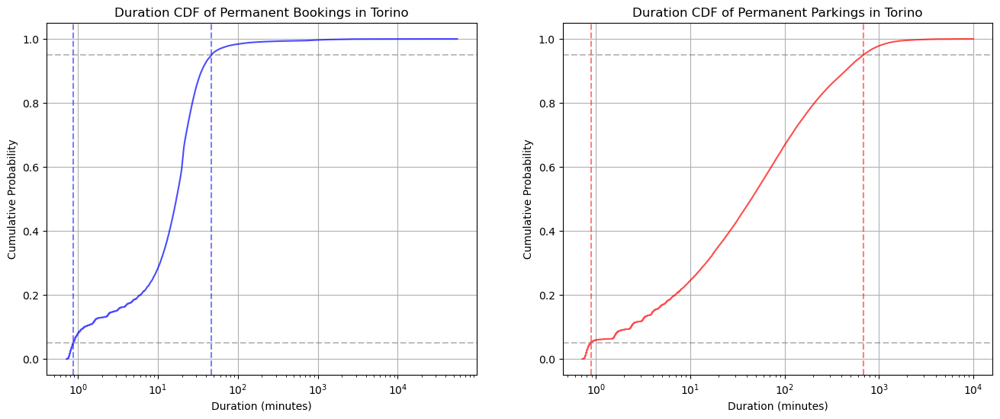

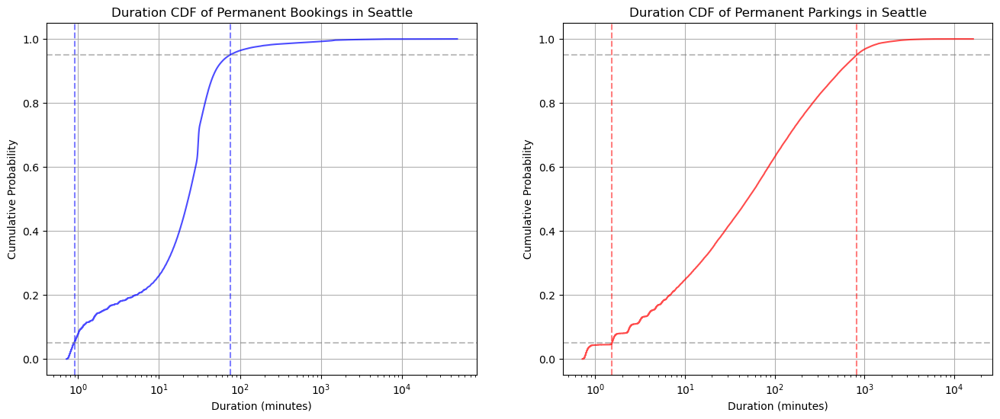

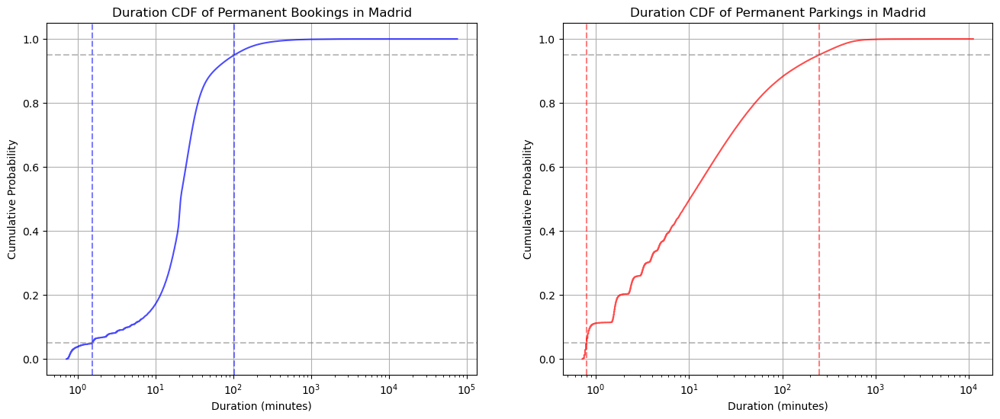

In [7]:
# for each city creates a figure comparing bookings and parkings
for city in cities:
    # plot the duration distributions as a CDF function
    plt.figure(figsize=(16, 6))

    plt.subplot(1, 2, 1)
    plt.plot(np.sort(durations[city]["bookings"]), np.arange(1, len(durations[city]["bookings"])+1) / len(durations[city]["bookings"]), color='blue', alpha=0.7)
    # show the 5% percentile lines
    plt.axhline(y=0.05, color='gray', linestyle='--', alpha=0.5)
    plt.axvline(x=np.percentile(durations[city]["bookings"], 5), color='blue', linestyle='--', alpha=0.5)
    # show the 95% percentile lines
    plt.axhline(y=0.95, color='gray', linestyle='--', alpha=0.5)
    plt.axvline(x=np.percentile(durations[city]["bookings"], 95), color='blue', linestyle='--', alpha=0.5)
    plt.title(f'Duration CDF of Permanent Bookings in {city}')
    plt.xlabel('Duration (minutes)')
    plt.ylabel('Cumulative Probability')
    plt.xscale('log')
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(np.sort(durations[city]["parkings"]), np.arange(1, len(durations[city]["parkings"])+1) / len(durations[city]["parkings"]), color='red', alpha=0.7)
    # show the 5% percentile lines
    plt.axhline(y=0.05, color='gray', linestyle='--', alpha=0.5)
    plt.axvline(x=np.percentile(durations[city]["parkings"], 5), color='red', linestyle='--', alpha=0.5)
    # show the 95% percentile lines
    plt.axhline(y=0.95, color='gray', linestyle='--', alpha=0.5)
    plt.axvline(x=np.percentile(durations[city]["parkings"], 95), color='red', linestyle='--', alpha=0.5)
    plt.title(f'Duration CDF of Permanent Parkings in {city}')
    plt.xlabel('Duration (minutes)')
    plt.ylabel('Cumulative Probability')
    plt.xscale('log')
    plt.grid(True)

    plt.show()

CDF has been plotted with logarithmic scale on x-axis to better visualize the distribution of the data, since there are some high outliers which could skew the results. From these plots we can see that trends of bookings and parkings are similar in all cities. We have highlighted the 5% and the 95% percentiles in order to see the range of values in which the majority of bookings and parkings fall and detect possible outliers.

How do you interpret the differences in the CDFs?

/opt/conda/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


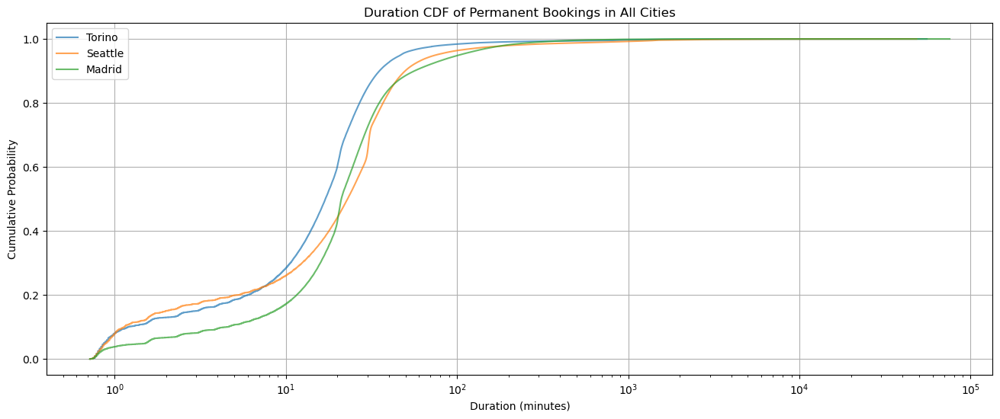

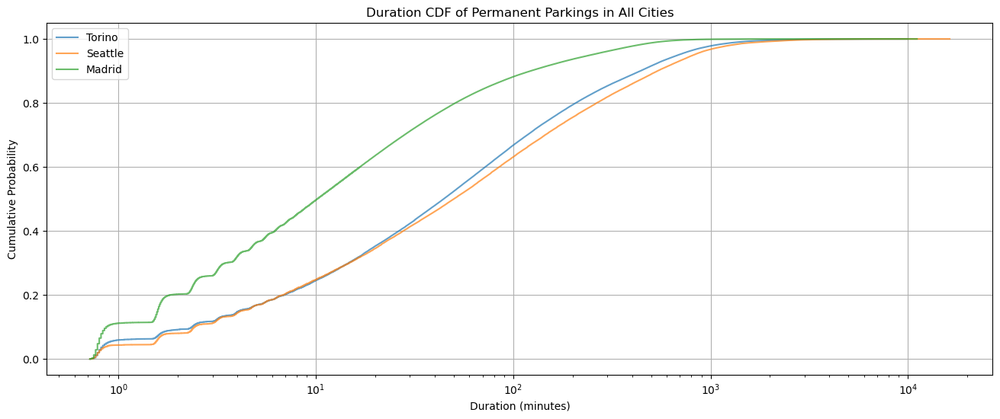

In [8]:
# plot the CDF bookings duration of all the cities together
plt.figure(figsize=(16, 6))
for city in cities:
    plt.plot(np.sort(durations[city]["bookings"]), np.arange(1, len(durations[city]["bookings"])+1) / len(durations[city]["bookings"]), label=city, alpha=0.7)

plt.title('Duration CDF of Permanent Bookings in All Cities')
plt.xlabel('Duration (minutes)')
plt.ylabel('Cumulative Probability')
plt.legend()
plt.xscale('log')
plt.grid(True)

plt.show()

# plot the CDF parkings duration of all the cities together
plt.figure(figsize=(16, 6))
for city in cities:
    plt.plot(np.sort(durations[city]["parkings"]), np.arange(1, len(durations[city]["parkings"])+1) / len(durations[city]["parkings"]), label=city, alpha=0.7)
plt.title('Duration CDF of Permanent Parkings in All Cities')
plt.xlabel('Duration (minutes)')
plt.ylabel('Cumulative Probability')
plt.legend()
plt.xscale('log')
plt.grid(True)

plt.show()

The comparison between the CDFs of different cities shows very similar trends for both bookings and parkings durations.

Does the CDF change over time? E.g., aggregate per different weeks of data, or per different days. Are these CDFs different? Why?

In [4]:
# check services for my cities:

cities = ["Torino", "Seattle", "Madrid"]

for city in cities:
    in_car2go = city in db.PermanentBookings.distinct("city")
    in_enjoy = city in db.enjoy_PermanentBookings.distinct("city")
    
    print(f"{city}: Car2Go = {in_car2go}, Enjoy = {in_enjoy}")

Torino: Car2Go = True, Enjoy = True
Seattle: Car2Go = True, Enjoy = False
Madrid: Car2Go = True, Enjoy = False


In [5]:
import pytz

# build a dictionary with city data to associate the utc offset, rental and parking collections, service name, and timezone
city_data = {
    # Torino had both services
    "Torino": {
        "rental_collection": db.PermanentBookings,
        "parking_collection": db.PermanentParkings,
        "service": "Car2Go",
        "timezone": pytz.timezone("Europe/Rome")  # CET/CEST
    },
    "Torino_enjoy": {
        "rental_collection": db.enjoy_PermanentBookings,
        "parking_collection": db.enjoy_PermanentParkings,
        "service": "Enjoy",
        "timezone": pytz.timezone("Europe/Rome")  # CET/CEST
    },
    # Seattle only Car2Go
    "Seattle": {
        "rental_collection": db.PermanentBookings,
        "parking_collection": db.PermanentParkings,
        "service": "Car2Go",
        "timezone": pytz.timezone("America/Los_Angeles")  # Pacific Time
    },
    # Madrid only Car2Go
    "Madrid": {
        "rental_collection": db.PermanentBookings,
        "parking_collection": db.PermanentParkings,
        "service": "Car2Go",
        "timezone": pytz.timezone("Europe/Madrid")  # CET/CEST
    }
}

Comparison between working week and holiday week.

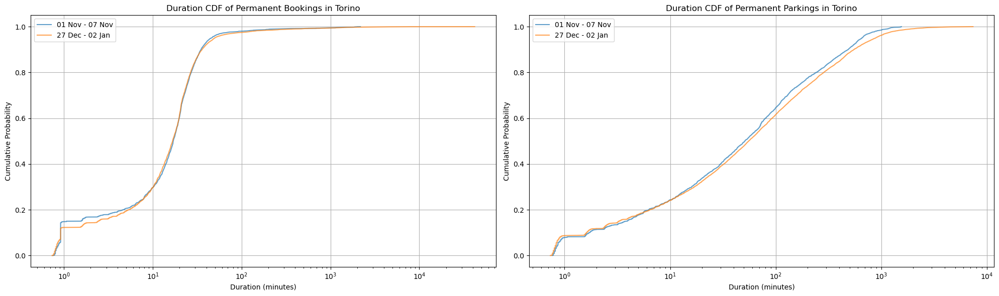

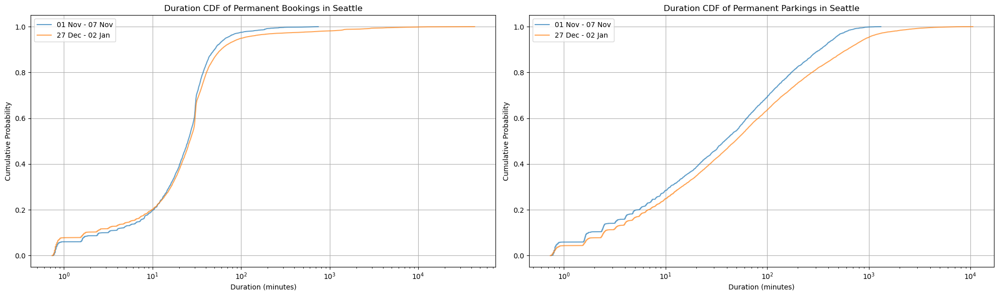

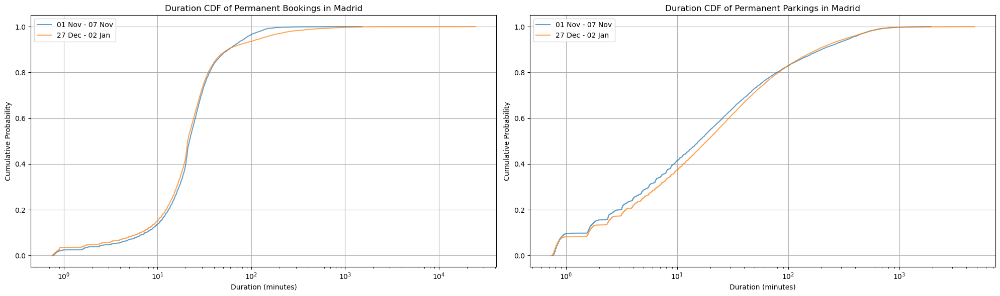

In [87]:
# Define weekly time periods to compare
time_periods = []
start = datetime(2017, 11, 1)
end = datetime(2018, 1, 31)

# Generate weekly periods
current = start
while current < end:
    week_end = min(current + timedelta(days=6), end)
    time_periods.append((current, week_end))
    current = week_end + timedelta(days=1)

# for each city
for city in cities:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))  # Two subplots side by side
    
    # For each weekly period
    for start_date, end_date in time_periods:
        # use only the first week and the christmas week
        if not (start_date == time_periods[0][0] or (start_date.month == 12 and start_date.day >= 24)):
            continue

        pipeline = [
            {"$match": {
                "city": city,
                "init_date": {"$gte": start_date, "$lt": end_date}
            }},
            {"$project": {
                "_id": 0,
                "duration": {"$divide": [{"$subtract": ["$final_time", "$init_time"]}, 60]}
            }}
        ]

        bookings_duration = list(db["PermanentBookings"].aggregate(pipeline))
        parkings_duration = list(db["PermanentParkings"].aggregate(pipeline))

        bookings_duration = [doc['duration'] for doc in bookings_duration if 'duration' in doc]
        parkings_duration = [doc['duration'] for doc in parkings_duration if 'duration' in doc]
        
        # Plot CDF for bookings
        if len(bookings_duration) > 0:
            ax1.plot(np.sort(bookings_duration), 
                    np.arange(1, len(bookings_duration)+1) / len(bookings_duration),
                    alpha=0.7,
                    label=f'{start_date.strftime("%d %b")} - {end_date.strftime("%d %b")}')
        
        # Plot CDF for parkings
        if len(parkings_duration) > 0:
            ax2.plot(np.sort(parkings_duration), 
                    np.arange(1, len(parkings_duration)+1) / len(parkings_duration),
                    alpha=0.7,
                    label=f'{start_date.strftime("%d %b")} - {end_date.strftime("%d %b")}')

    # Configure bookings subplot
    ax1.set_title(f'Duration CDF of Permanent Bookings in {city}')
    ax1.set_xlabel('Duration (minutes)')
    ax1.set_ylabel('Cumulative Probability')
    ax1.set_xscale('log')
    ax1.grid(True)
    ax1.legend()
    
    # Configure parkings subplot
    ax2.set_title(f'Duration CDF of Permanent Parkings in {city}')
    ax2.set_xlabel('Duration (minutes)')
    ax2.set_ylabel('Cumulative Probability')
    ax2.set_xscale('log')
    ax2.grid(True)
    ax2.legend()
    
    plt.tight_layout()
    plt.show()

Consider the system utilization over time: aggregate rentals per hour of the day, and then plot the
number of booked/parked cars (or percentage of booked/parked cars) per hour versus time of day.
Do you notice any outliers? Can you explain them?

In [6]:
# create a list to stor rental and parking data for plotting 
rental_data = []
parking_data = []
start_date = datetime(2017, 11, 1, 0, 0, 0)
end_date = datetime(2018, 1, 31, 23, 59, 59)

for city, data in city_data.items():
    if city == "Torino_enjoy":
        city = "Torino"
    rental_collection = data["rental_collection"]
    parking_collection = data["parking_collection"]
    service = data["service"]
    timezone = data["timezone"]

    # Aggregation pipeline for rentals
    pipeline = [
        {
            "$match": {
                "city": city,  # Filter for the specific city
                "init_date": {  # Filter for the date range
                    "$gte": start_date,
                    "$lte": end_date
                }
            }
        },
        {
            "$project": {
                "init_time": 1,  # Include the init_time field for conversion
                "_id": 0  # Exclude the _id field
            }
        }
    ]

    # Execute the aggregation pipelines
    rental_result = list(rental_collection.aggregate(pipeline))
    parking_result = list(parking_collection.aggregate(pipeline))

    # Prepare data for plotting rentals
    rental_hours = []
    rental_counts = []

    for rental in rental_result:
        init_time = datetime.utcfromtimestamp(rental["init_time"])  # Convert from Unix timestamp
        local_time = pytz.utc.localize(init_time).astimezone(timezone)  # Convert to local time
        hour = local_time.hour  # Extract the hour of the day
        rental_hours.append(hour)

    # Group and count rentals by hour
    for hour in set(rental_hours):
        rental_counts.append(rental_hours.count(hour))

    # Prepare data for plotting parkings
    parking_hours = []
    parking_counts = []

    for parking in parking_result:
        init_time = datetime.utcfromtimestamp(parking["init_time"])  # Convert from Unix timestamp
        local_time = pytz.utc.localize(init_time).astimezone(timezone)  # Convert to local time
        hour = local_time.hour  # Extract the hour of the day
        parking_hours.append(hour)

    # Group and count parkings by hour
    for hour in set(parking_hours):
        parking_counts.append(parking_hours.count(hour))

    # Add city-specific rental data for later plotting
    rental_data.append((list(range(24)), rental_counts, f"{city} - {service} Rentals"))

    # Add city-specific parking data for later plotting
    parking_data.append((list(range(24)), parking_counts, f"{city} - {service} Parkings"))

/tmp/ipykernel_71/3312220689.py:62: DeprecationWarning: datetime.datetime.utcfromtimestamp() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.fromtimestamp(timestamp, datetime.UTC).
  init_time = datetime.utcfromtimestamp(rental["init_time"])  # Convert from Unix timestamp
/tmp/ipykernel_71/3312220689.py:76: DeprecationWarning: datetime.datetime.utcfromtimestamp() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.fromtimestamp(timestamp, datetime.UTC).
  init_time = datetime.utcfromtimestamp(parking["init_time"])  # Convert from Unix timestamp


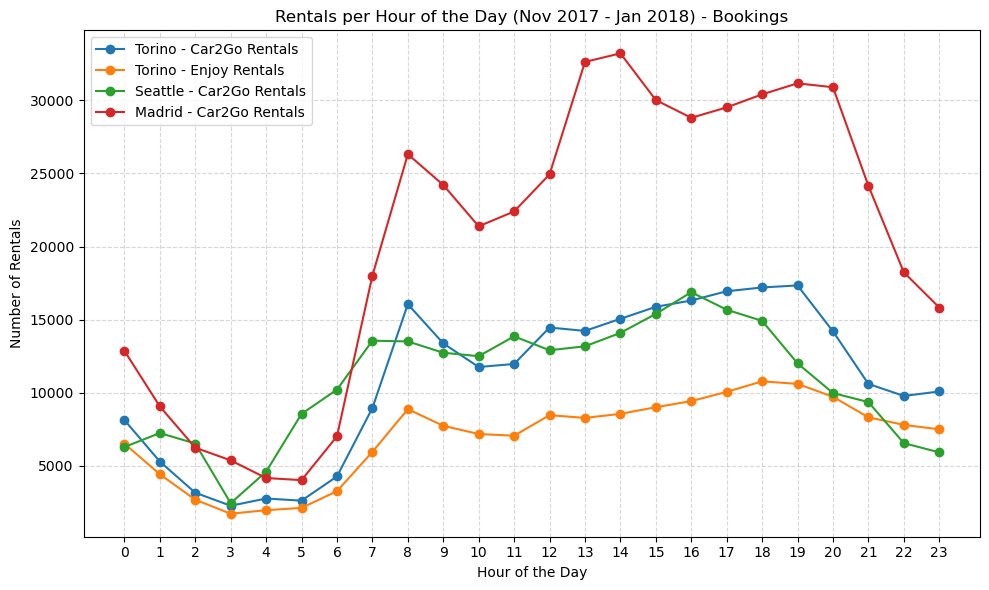

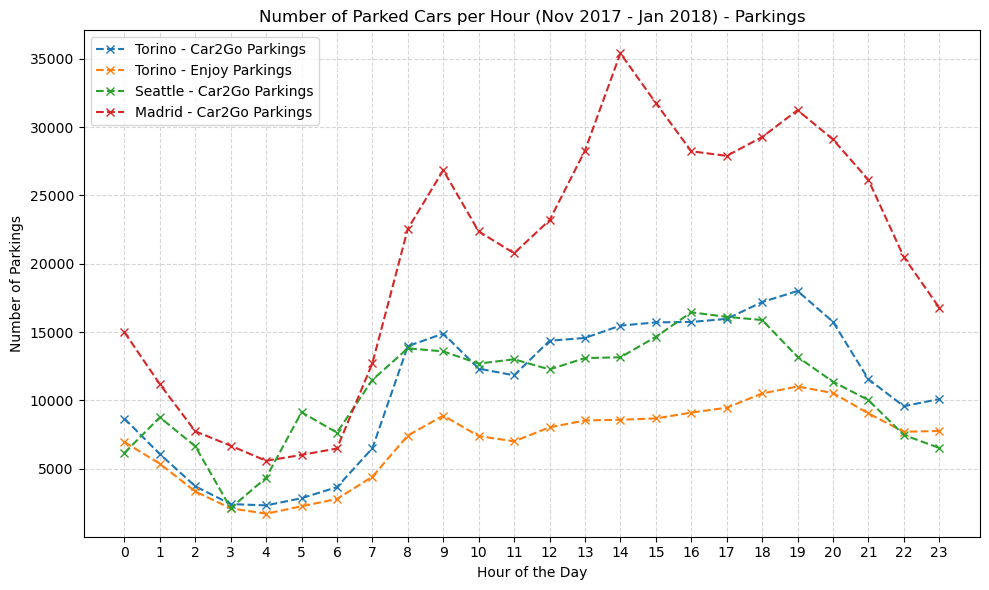

In [13]:
# Plot Rentals Data
plt.figure(figsize=(10, 6))

# Iterate through rental data
for rental_hours, rental_counts, label in rental_data:
    if len(rental_hours) == len(rental_counts) and len(rental_counts) > 0:
        plt.plot(rental_hours, rental_counts, marker='o', label=label)
    else:
        print(f"Skipping {label} due to mismatched or empty data")
        
# Set x-axis labels to every hour (assuming rental_hours is a list of hour values)
plt.xticks(range(0, 24))  # This sets x-ticks to be from 0 to 23 (for each hour)
# Set labels and title
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Rentals")
plt.title("Rentals per Hour of the Day (Nov 2017 - Jan 2018) - Bookings")
plt.legend()
plt.grid(visible=True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

# Plot Parkings Data
plt.figure(figsize=(10, 6))
for parking_hours, parking_counts, label in parking_data:
    plt.plot(parking_hours, parking_counts, marker='x', linestyle="--", label=label)
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Parkings")
plt.title("Number of Parked Cars per Hour (Nov 2017 - Jan 2018) - Parkings")
plt.xticks(range(0, 24))  # Set x-axis ticks from 0 to 23
plt.legend()
plt.grid(visible=True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

Derive a criterion to filter possible outliers (e.g., booking periods that are too short/too long), to obtain rentals from bookings, filtering system issues or problems with the data collection.

In [19]:
# to remove the outliers in the duration we can remove values below 5th percentile and above 95th percentile
start = int(datetime(2017, 11, 1, 0, 0, 0).timestamp())
end = int(datetime(2018, 2, 1, 0, 0, 0).timestamp())

durations = {}

# select the duration of permament bookings and parkings in each city
pipeline = [
    {
        "$match": {
            "city": {"$in": ["Torino", "Seattle", "Madrid"]},
            "init_time": {"$gte": start, "$lt": end},
            "final_time": {"$exists": True, "$ne": None}
        }
    },
    {
        "$project": {
            "city": 1,  # include the city field
            "init_time": 1,  # include the init_time field
            "final_time": 1,    # include the final_time field  
            "duration": {"$divide": [{"$subtract": ["$final_time", "$init_time"]}, 60]} # compute the duration in minutes
        }
    }
]
bookings_duration = list(db["PermanentBookings"].aggregate(pipeline))
parkings_duration = list(db["PermanentParkings"].aggregate(pipeline))

# store the duration list in a dictionary for each city
durations = {
    city: {
        "bookings": [doc['duration'] for doc in bookings_duration if doc['city'] == city],
        "parkings": [doc['duration'] for doc in parkings_duration if doc['city'] == city]
    }
    for city in cities
}

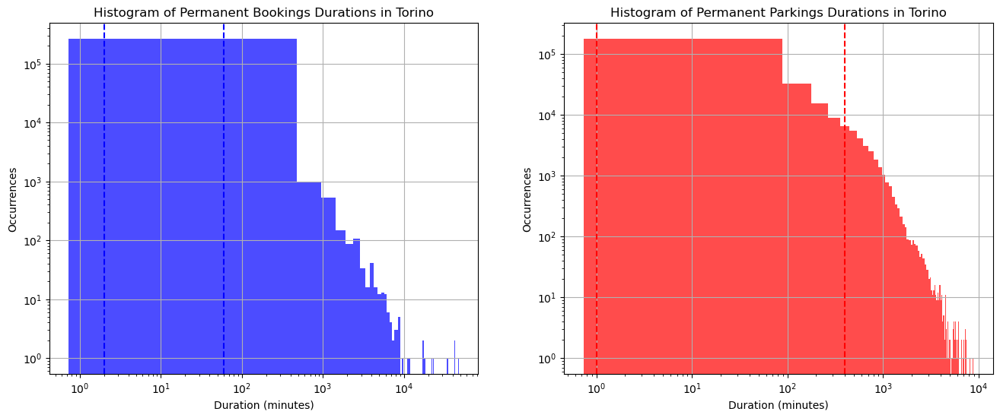

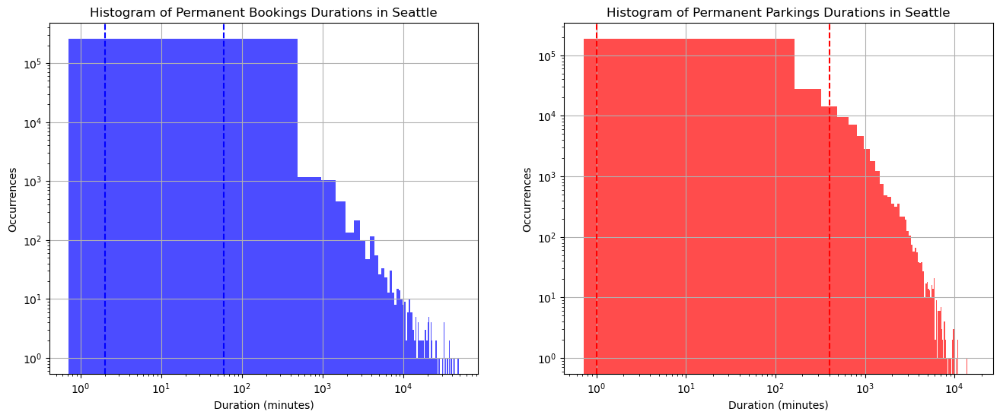

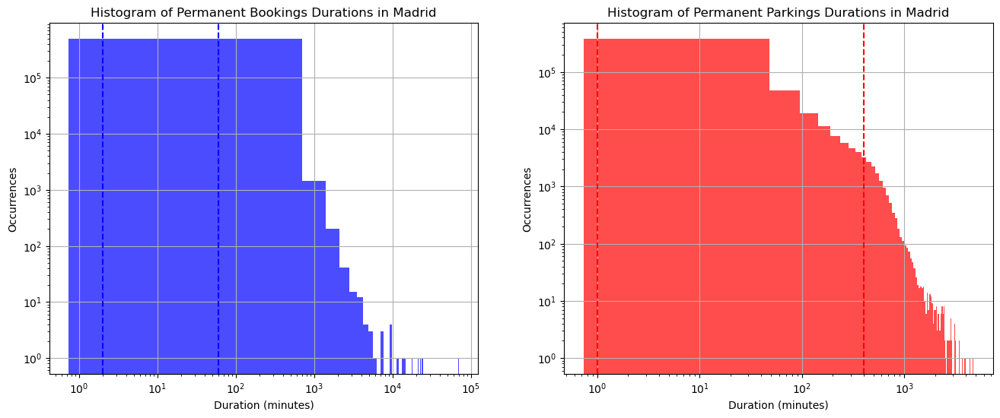

Processing outliers for city: Torino
	Bookings:
	Total count: 264503
	Count in range [2, 60]: 222286 (84.04%)
	Below range: 32596 (12.32%)
	Above range: 9621 (3.64%)
	Parkings:
	Total count: 264542
	Count in range [1, 400]: 215273 (81.38%)
	Below range: 22661 (8.57%)
	Above range: 26608 (10.06%)


Processing outliers for city: Seattle
	Bookings:
	Total count: 260397
	Count in range [2, 60]: 200999 (77.19%)
	Below range: 39265 (15.08%)
	Above range: 20133 (7.73%)
	Parkings:
	Total count: 260881
	Count in range [1, 400]: 211121 (80.93%)
	Below range: 11216 (4.30%)
	Above range: 38544 (14.77%)


Processing outliers for city: Madrid
	Bookings:
	Total count: 493800
	Count in range [2, 60]: 417280 (84.50%)
	Below range: 25225 (5.11%)
	Above range: 51295 (10.39%)
	Parkings:
	Total count: 494464
	Count in range [1, 400]: 428201 (86.60%)
	Below range: 52668 (10.65%)
	Above range: 13595 (2.75%)




In [136]:
# plot an histogram of occurrences of durations of bookings and parkings for each city
for city in cities:
    plt.figure(figsize=(16, 6))
    plt.subplot(1, 2, 1)
    plt.hist(durations[city]["bookings"], bins=100, color='blue', alpha=0.7)
    plt.title(f'Histogram of Permanent Bookings Durations in {city}')
    plt.xlabel('Duration (minutes)')
    plt.ylabel('Occurrences')
    plt.xscale('log')
    plt.yscale('log')
    # plot bound thresholds
    plt.axvline(x=2, color='blue', linestyle='--')
    plt.axvline(x=60, color='blue', linestyle='--')
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.hist(durations[city]["parkings"], bins=100, color='red', alpha=0.7)
    plt.title(f'Histogram of Permanent Parkings Durations in {city}')
    plt.xlabel('Duration (minutes)')
    plt.ylabel('Occurrences')
    plt.xscale('log')
    plt.yscale('log')
    # plot bound thresholds
    plt.axvline(x=1, color='red', linestyle='--')
    plt.axvline(x=400, color='red', linestyle='--')
    plt.grid(True)

    plt.show()

# function to perform outlier removal and keep data info
def remove_outliers(data, lower_bound, upper_bound):
    if len(data) == 0:
        return data
    
    count_in_range = sum(1 for d in data if lower_bound <= d['duration'] <= upper_bound)
    count_below_range = sum(1 for d in data if d['duration'] < lower_bound)
    count_above_range = sum(1 for d in data if d['duration'] > upper_bound)
    total_count = len(data)
    percentage = (count_in_range / total_count) * 100 if total_count > 0 else 0
    print(f"\tTotal count: {total_count}\n\tCount in range [{lower_bound}, {upper_bound}]: {count_in_range} ({percentage:.2f}%)\n\tBelow range: {count_below_range} ({(count_below_range/total_count*100):.2f}%)\n\tAbove range: {count_above_range} ({(count_above_range/total_count*100):.2f}%)")
    filtered_data = [doc for doc in data if lower_bound <= doc['duration'] <= upper_bound]
    return filtered_data

filtered_booking = {}
filtered_parking = {}

for city in cities:
    print(f"Processing outliers for city: {city}\n\tBookings:")
    filtered_booking[city] = remove_outliers([doc for doc in bookings_duration if doc['city'] == city], 2, 60)
    print(f"\tParkings:")
    filtered_parking[city] = remove_outliers([doc for doc in parkings_duration if doc['city'] == city], 1, 400)
    print("\n")

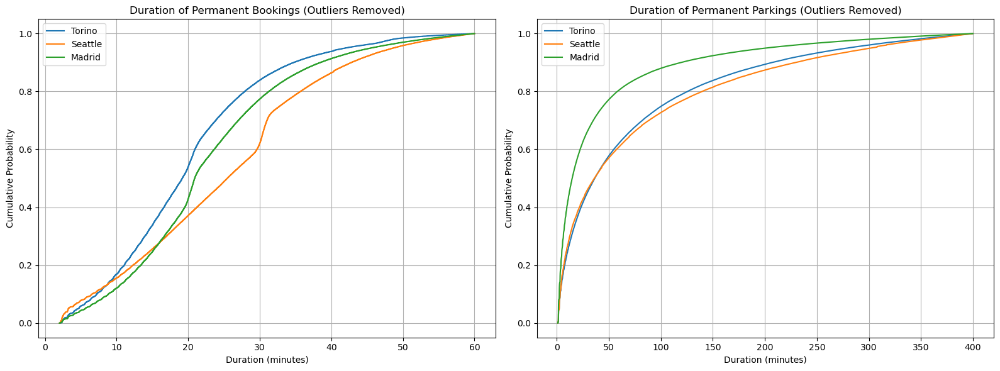

In [137]:
# plot filtered durations
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
for city in cities:
    durations_list = [doc['duration'] for doc in filtered_booking[city]]
    plt.plot(np.sort(durations_list), np.arange(1, len(durations_list)+1) / len(durations_list), label=city)
plt.title('Duration of Permanent Bookings (Outliers Removed)')
plt.xlabel('Duration (minutes)')
plt.ylabel('Cumulative Probability')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
for city in cities:
    durations_list = [doc['duration'] for doc in filtered_parking[city]]
    plt.plot(np.sort(durations_list), np.arange(1, len(durations_list)+1) / len(durations_list), label=city)
plt.title('Duration of Permanent Parkings (Outliers Removed)')
plt.xlabel('Duration (minutes)')
plt.ylabel('Cumulative Probability')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Filtering data as above, consider the system utilization over time. How do they change compared to
the unfiltered versions? Are you able to filter outliers efficiently for both bookings and parkings?
Consider also to plot the CDF of the filtered events. How do these compare to the unfiltered versions?

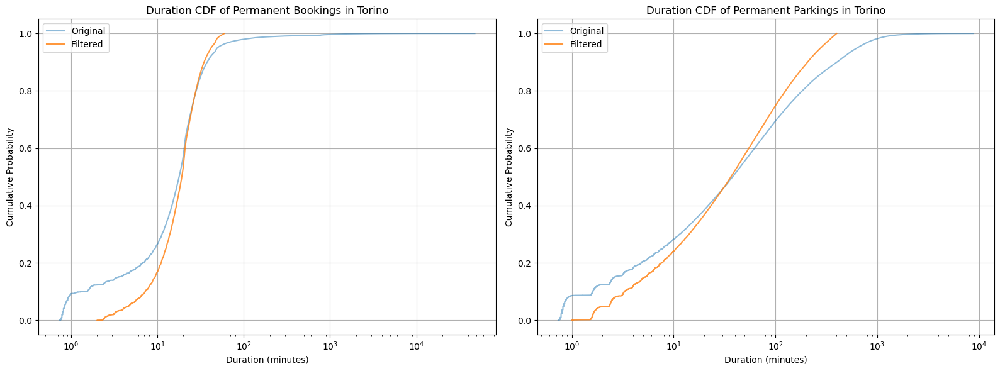

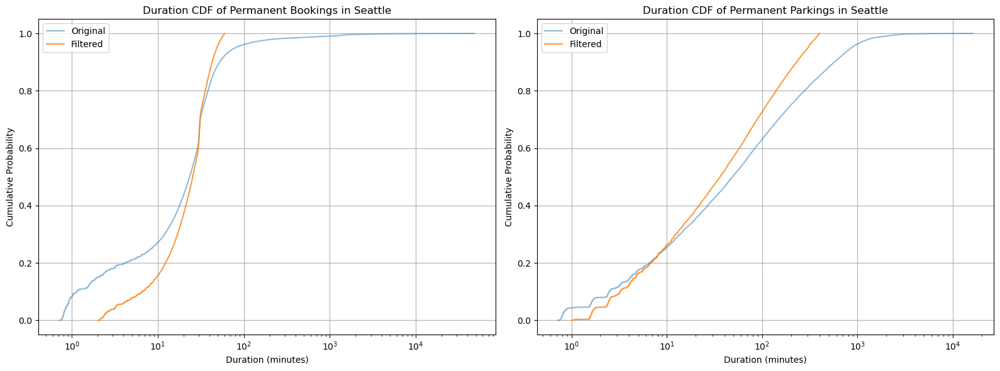

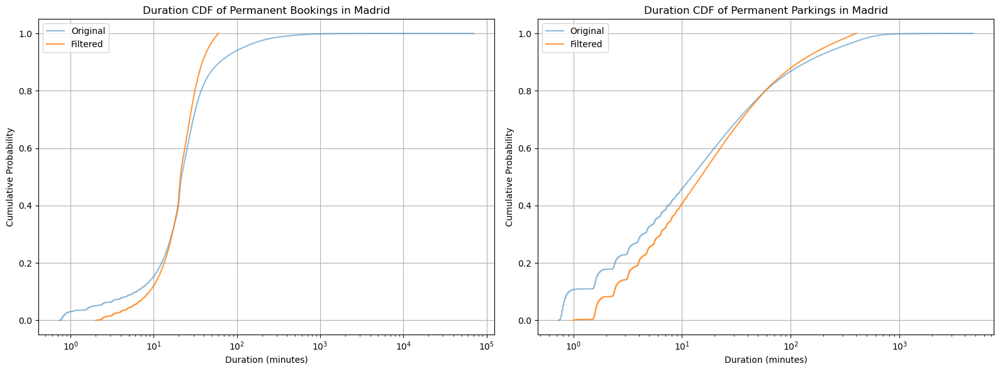

In [138]:
# for each city plot the normal and filtered durations
for city in cities:
    plt.figure(figsize=(16, 6))
    plt.subplot(1, 2, 1)
    plt.plot(np.sort(durations[city]["bookings"]), np.arange(1, len(durations[city]["bookings"])+1) / len(durations[city]["bookings"]), label='Original', alpha=0.5)
    durations_list = [doc['duration'] for doc in filtered_booking[city]]
    plt.plot(np.sort(durations_list), np.arange(1, len(durations_list)+1) / len(durations_list), label='Filtered', alpha=0.8)
    plt.title(f'Duration CDF of Permanent Bookings in {city}')
    plt.xlabel('Duration (minutes)')
    plt.ylabel('Cumulative Probability')
    plt.xscale('log')
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(np.sort(durations[city]["parkings"]), np.arange(1, len(durations[city]["parkings"])+1) / len(durations[city]["parkings"]), label='Original', alpha=0.5)
    durations_list = [doc['duration'] for doc in filtered_parking[city]]
    plt.plot(np.sort(durations_list), np.arange(1, len(durations_list)+1) / len(durations_list), label='Filtered', alpha=0.8)
    plt.title(f'Duration CDF of Permanent Parkings in {city}')
    plt.xlabel('Duration (minutes)')
    plt.ylabel('Cumulative Probability')
    plt.xscale('log')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Filtering the data as above, compute the average, median, standard deviation, and percentiles of the
booking/parking duration over time (e.g., per each day of the collection).

In [140]:
# compute daily statistics of unfiltered bookings and parkings for each city
# convert init_time to datetime for easier grouping
for doc in bookings_duration:
    local_time = datetime.fromtimestamp(doc['init_time'], tz=city_data[doc['city']]["timezone"])
    doc['local_date'] = local_time.date()

for doc in parkings_duration:
    local_time = datetime.fromtimestamp(doc['init_time'], tz=city_data[doc['city']]["timezone"])
    doc['local_date'] = local_time.date()   

In [141]:
# function to group data by n days
def group_by_days(data, n):
    grouped_data = {}
    for doc in data:
        city = doc['city']
        date = doc['local_date']
        duration = doc['duration']
        
        # Determine the start date of the n-day period
        period_start = date - timedelta(days=date.day % n)
        
        if city not in grouped_data:
            grouped_data[city] = {}
        if period_start not in grouped_data[city]:
            grouped_data[city][period_start] = []
        
        grouped_data[city][period_start].append(duration)
    
    return grouped_data

# group bookings and parkings by 1-day periods
grouped_bookings = group_by_days(bookings_duration, 1)
grouped_parkings = group_by_days(parkings_duration, 1)

In [142]:
# compute statistics of grouped data
def compute_statistics(grouped_data):
    statistics = {}
    for city, periods in grouped_data.items():
        statistics[city] = {}
        for period_start, durations in periods.items():
            if len(durations) == 0:
                continue
            statistics[city][period_start] = {
                "mean": np.mean(durations),
                "median": np.median(durations),
                "std": np.std(durations),
                "25th_percentile": np.percentile(durations, 25),
                "75th_percentile": np.percentile(durations, 75),
                "count": len(durations)
            }
    return statistics

booking_stats = compute_statistics(grouped_bookings)
parking_stats = compute_statistics(grouped_parkings)

NameError: name 'booking_stats' is not defined

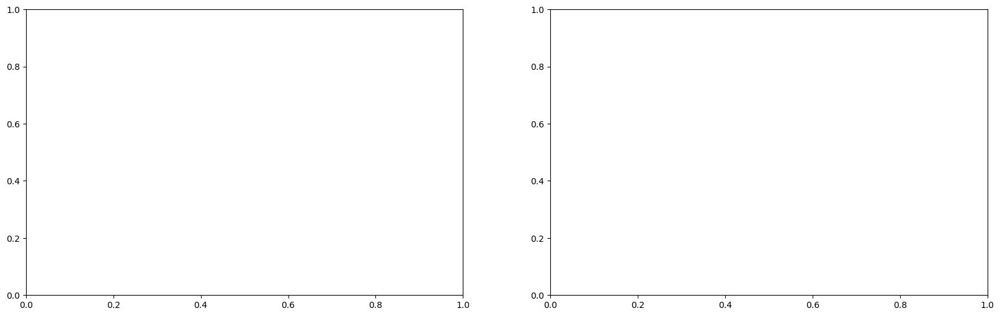

In [18]:
# plot daily mean duration for each city
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

# Plot bookings in the first subplot
for city in cities:
    dates = sorted(booking_stats[city].keys())
    means = [booking_stats[city][date]['mean'] for date in dates]
    ax1.plot(dates, means, marker='o', label=city)
    # highlight weekends
    for date in dates:
        if date.weekday() >= 5:  # Saturday or Sunday
            ax1.axvspan(date - timedelta(hours=12), date + timedelta(hours=12), color='gray', alpha=0.2)
    
ax1.set_title('Daily Mean Duration - Bookings')
ax1.set_xlabel('Date')
ax1.set_ylabel('Mean Duration (minutes)')
ax1.legend()
ax1.grid(True)

# plot parkings in the second subplot
for city in cities:
    dates = sorted(parking_stats[city].keys())
    means = [parking_stats[city][date]['mean'] for date in dates]
    ax2.plot(dates, means, marker='x', label=city)
    # highlight weekends
    for date in dates:
        if date.weekday() >= 5:  # Saturday or Sunday
            ax2.axvspan(date - timedelta(hours=12), date + timedelta(hours=12), color='gray', alpha=0.2)

ax2.set_title('Daily Mean Duration - Parkings')
ax2.set_xlabel('Date')
ax2.set_ylabel('Mean Duration (minutes)')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()

# plot daily std deviation of duration for each city
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

# Plot bookings in the first subplot
for city in cities:
    dates = sorted(booking_stats[city].keys())
    stds = [booking_stats[city][date]['std'] for date in dates]
    ax1.plot(dates, stds, marker='o', label=city)

ax1.set_title('Daily Std Deviation - Bookings')
ax1.set_xlabel('Date')
ax1.set_ylabel('Std Deviation (minutes)')
ax1.legend()
ax1.grid(True)

# plot parkings in the second subplot
for city in cities:
    dates = sorted(parking_stats[city].keys())
    stds = [parking_stats[city][date]['std'] for date in dates]
    ax2.plot(dates, stds, marker='x', label=city)

ax2.set_title('Daily Std Deviation - Parkings')
ax2.set_xlabel('Date')
ax2.set_ylabel('Std Deviation (minutes)')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()

# plot daily median duration and percentiles for each city
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

# Plot bookings in the first subplot
for city in cities:
    dates = sorted(booking_stats[city].keys())
    medians = [booking_stats[city][date]['median'] for date in dates]
    percentiles_25 = [booking_stats[city][date]['25th_percentile'] for date in dates]
    percentiles_75 = [booking_stats[city][date]['75th_percentile'] for date in dates]
    ax1.plot(dates, medians, marker='o', label=city)
    ax1.fill_between(dates, percentiles_25, percentiles_75, alpha=0.2)

ax1.set_title('Daily Median Duration - Bookings')
ax1.set_xlabel('Date')
ax1.set_ylabel('Median Duration (minutes)')
ax1.legend()
ax1.grid(True)

# plot parkings in the second subplot
for city in cities:
    dates = sorted(parking_stats[city].keys())
    medians = [parking_stats[city][date]['median'] for date in dates]
    percentiles_25 = [parking_stats[city][date]['25th_percentile'] for date in dates]
    percentiles_75 = [parking_stats[city][date]['75th_percentile'] for date in dates]
    ax2.plot(dates, medians, marker='x', label=city)
    ax2.fill_between(dates, percentiles_25, percentiles_75, alpha=0.2)

ax2.set_title('Daily Median Duration - Parkings')
ax2.set_xlabel('Date')
ax2.set_ylabel('Median Duration (minutes)')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()

In [83]:
# print november date in the bookings set to check missing days
for city in cities:
    november_dates = [date for date in booking_stats[city].keys() if date.month == 11]
    print(f"November dates in bookings for {city}: {sorted(november_dates)}")

November dates in bookings for Torino: [datetime.date(2017, 11, 1), datetime.date(2017, 11, 2), datetime.date(2017, 11, 13), datetime.date(2017, 11, 14), datetime.date(2017, 11, 15), datetime.date(2017, 11, 16), datetime.date(2017, 11, 17), datetime.date(2017, 11, 18), datetime.date(2017, 11, 19), datetime.date(2017, 11, 20), datetime.date(2017, 11, 21), datetime.date(2017, 11, 22), datetime.date(2017, 11, 23), datetime.date(2017, 11, 24), datetime.date(2017, 11, 25), datetime.date(2017, 11, 26), datetime.date(2017, 11, 27), datetime.date(2017, 11, 28), datetime.date(2017, 11, 29), datetime.date(2017, 11, 30)]
November dates in bookings for Seattle: [datetime.date(2017, 11, 1), datetime.date(2017, 11, 2), datetime.date(2017, 11, 13), datetime.date(2017, 11, 14), datetime.date(2017, 11, 15), datetime.date(2017, 11, 16), datetime.date(2017, 11, 17), datetime.date(2017, 11, 18), datetime.date(2017, 11, 19), datetime.date(2017, 11, 20), datetime.date(2017, 11, 21), datetime.date(2017, 11, 

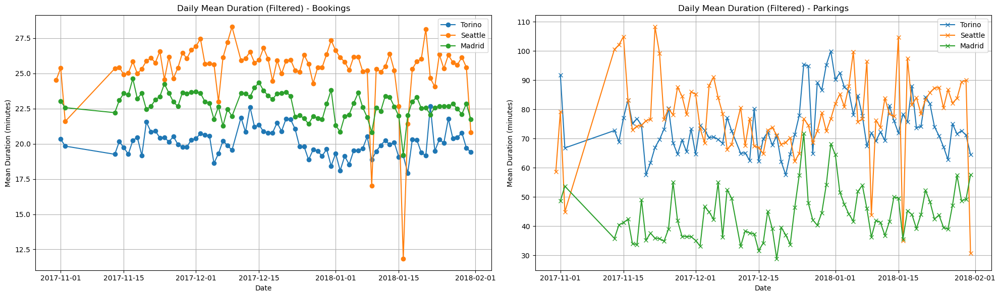

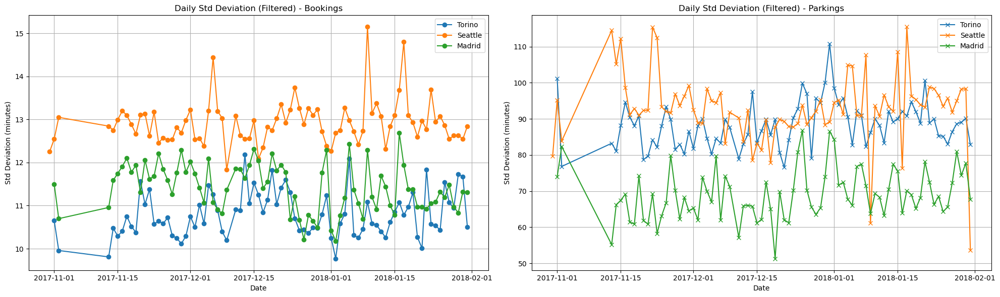

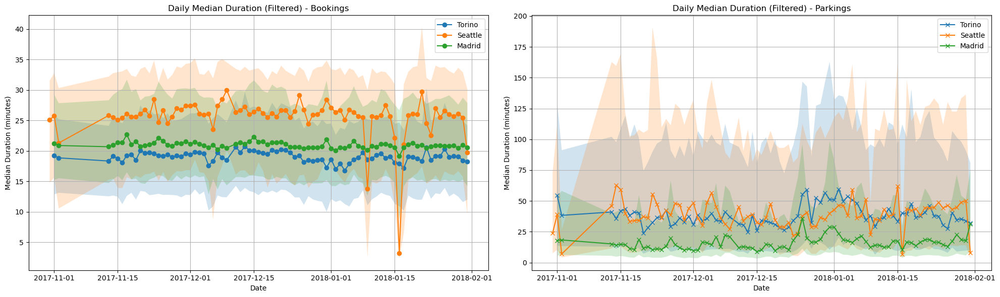

In [143]:
# group filtered data by days
grouped_filtered_bookings = group_by_days(
    [doc for city in cities for doc in filtered_booking[city]], 1)
grouped_filtered_parkings = group_by_days(
    [doc for city in cities for doc in filtered_parking[city]], 1)

# compute statistics of grouped filtered data
filtered_booking_stats = compute_statistics(grouped_filtered_bookings)
filtered_parking_stats = compute_statistics(grouped_filtered_parkings)

# plot daily mean duration for each city (filtered data)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))
# Plot bookings in the first subplot
for city in cities:
    dates = sorted(filtered_booking_stats[city].keys())
    means = [filtered_booking_stats[city][date]['mean'] for date in dates]
    ax1.plot(dates, means, marker='o', label=city)
ax1.set_title('Daily Mean Duration (Filtered) - Bookings')
ax1.set_xlabel('Date')
ax1.set_ylabel('Mean Duration (minutes)')
ax1.legend()
ax1.grid(True)

# plot parkings in the second subplot
for city in cities:
    dates = sorted(filtered_parking_stats[city].keys())
    means = [filtered_parking_stats[city][date]['mean'] for date in dates]
    ax2.plot(dates, means, marker='x', label=city)
ax2.set_title('Daily Mean Duration (Filtered) - Parkings')
ax2.set_xlabel('Date')
ax2.set_ylabel('Mean Duration (minutes)')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()

# plot daily std deviation of duration for each city (filtered data)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))
# Plot bookings in the first subplot
for city in cities:
    dates = sorted(filtered_booking_stats[city].keys())
    stds = [filtered_booking_stats[city][date]['std'] for date in dates]
    ax1.plot(dates, stds, marker='o', label=city)
ax1.set_title('Daily Std Deviation (Filtered) - Bookings')
ax1.set_xlabel('Date')
ax1.set_ylabel('Std Deviation (minutes)')
ax1.legend()
ax1.grid(True)

# Plot parkings in the second subplot
for city in cities:
    dates = sorted(filtered_parking_stats[city].keys())
    stds = [filtered_parking_stats[city][date]['std'] for date in dates]
    ax2.plot(dates, stds, marker='x', label=city)
ax2.set_title('Daily Std Deviation (Filtered) - Parkings')
ax2.set_xlabel('Date')
ax2.set_ylabel('Std Deviation (minutes)')
ax2.legend()
ax2.grid(True)
plt.tight_layout()
plt.show()

# plot daily median duration and percentiles for each city (filtered data)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))
# Plot bookings in the first subplot
for city in cities:
    dates = sorted(filtered_booking_stats[city].keys())
    medians = [filtered_booking_stats[city][date]['median'] for date in dates]
    percentiles_25 = [filtered_booking_stats[city][date]['25th_percentile'] for date in dates]
    percentiles_75 = [filtered_booking_stats[city][date]['75th_percentile'] for date in dates]
    ax1.plot(dates, medians, marker='o', label=city)
    ax1.fill_between(dates, percentiles_25, percentiles_75, alpha=0.2)
ax1.set_title('Daily Median Duration (Filtered) - Bookings')
ax1.set_xlabel('Date')
ax1.set_ylabel('Median Duration (minutes)')
ax1.legend()
ax1.grid(True)

# plot parkings in the second subplot
for city in cities:
    dates = sorted(filtered_parking_stats[city].keys())
    medians = [filtered_parking_stats[city][date]['median'] for date in dates]
    percentiles_25 = [filtered_parking_stats[city][date]['25th_percentile'] for date in dates]
    percentiles_75 = [filtered_parking_stats[city][date]['75th_percentile'] for date in dates]
    ax2.plot(dates, medians, marker='x', label=city)
    ax2.fill_between(dates, percentiles_25, percentiles_75, alpha=0.2)
ax2.set_title('Daily Median Duration (Filtered) - Parkings')
ax2.set_xlabel('Date')  
ax2.set_ylabel('Median Duration (minutes)')
ax2.legend()
ax2.grid(True)
plt.tight_layout()
plt.show()

Is it possible to spot any periodicity (e.g., weekends vs weekdays, holidays versus working
periods)?

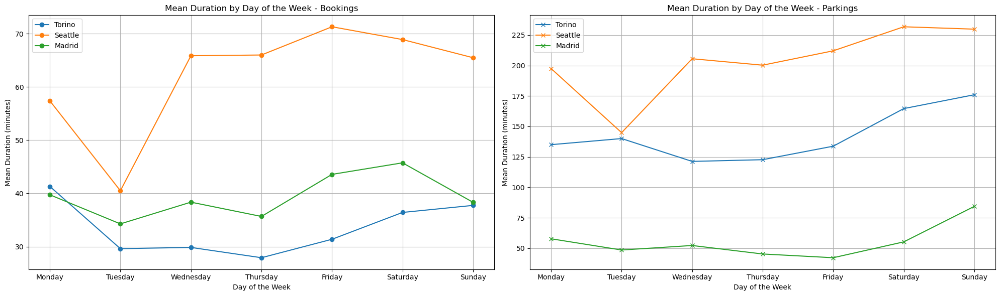

In [86]:
# group booking and parking by day of the week
def group_by_day_of_week(data):
    grouped_data = {}
    for doc in data:
        city = doc['city']
        init_time = datetime.fromtimestamp(doc['init_time'], tz=city_data[city]["timezone"])
        day_of_week = init_time.strftime('%A')  # Get the day of the week as a string
        
        if city not in grouped_data:
            grouped_data[city] = {}
        if day_of_week not in grouped_data[city]:
            grouped_data[city][day_of_week] = []
        
        grouped_data[city][day_of_week].append(doc['duration'])
    
    return grouped_data

# compute statistics by day of the week
grouped_dow_bookings = group_by_day_of_week(bookings_duration)
grouped_dow_parkings = group_by_day_of_week(parkings_duration)

dow_booking_stats = compute_statistics(grouped_dow_bookings)
dow_parking_stats = compute_statistics(grouped_dow_parkings)

# plot mean duration by day of the week for each city
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))
# Plot bookings in the first subplot
for city in cities:
    means = [dow_booking_stats[city][day]['mean'] for day in days_order if day in dow_booking_stats[city]]
    ax1.plot(days_order[:len(means)], means, marker='o', label=city)
ax1.set_title('Mean Duration by Day of the Week - Bookings')
ax1.set_xlabel('Day of the Week')
ax1.set_ylabel('Mean Duration (minutes)')
ax1.legend()
ax1.grid(True)  

# plot parkings in the second subplot
for city in cities:
    means = [dow_parking_stats[city][day]['mean'] for day in days_order if day in dow_parking_stats[city]]
    ax2.plot(days_order[:len(means)], means, marker='x', label=city)
ax2.set_title('Mean Duration by Day of the Week - Parkings')
ax2.set_xlabel('Day of the Week')
ax2.set_ylabel('Mean Duration (minutes)')
ax2.legend()
ax2.grid(True)
plt.tight_layout()
plt.show()

For the City 1 of your group, correlate the probability of a rental with the availability of other
transport means.

In [100]:
start_time = int(datetime(2017, 11, 1, 0, 0, 0).timestamp())
end_time = int(datetime(2018, 2, 1, 0, 0, 0).timestamp())

# extract those valid rentals in Torino for which there is also the data for public transport systems and group them according to bins of public transport duration
bins = list(range(0, 125, 5))
pipeline = [
    {
        "$match": {
            "city": "Torino",
            "init_time": {"$gte": start_time, "$lt": end_time},
            "final_time": {"$exists": True, "$ne": None},
            "public_transport.distance": {"$ne": -1}
        }
    },
    {
        "$project": {
            "init_time": 1,
            "final_time": 1,
            "pt_duration": {"$divide": ["$public_transport.duration", 60]},  # duration in minutes of public transport
        }
    },
    {
        "$bucket": {
            "groupBy": "$pt_duration",
            "boundaries": bins,
            "default": "Other",
            "output": {
                "count": {"$sum": 1}
            }
        }
    }
]
torino_bookings_with_pt = list(db["PermanentBookings"].aggregate(pipeline))

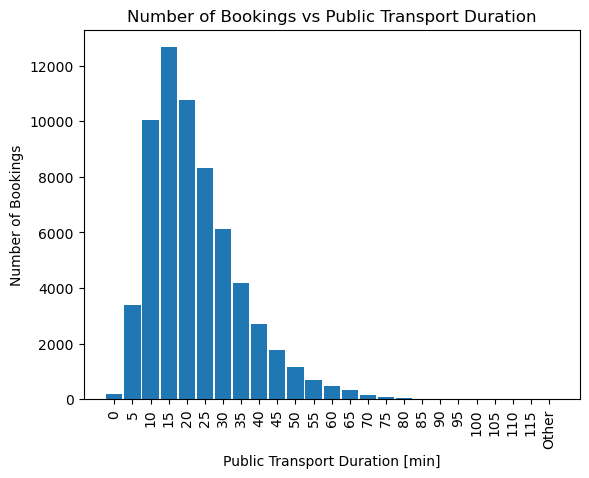

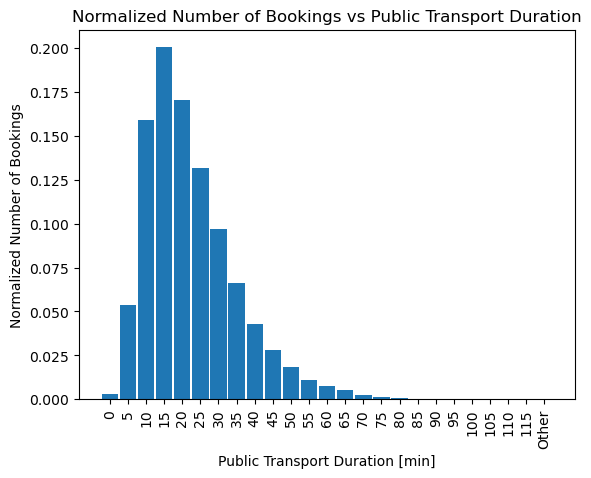

In [102]:
# group by public transport duration bins (e.g., 0-5 min, 5-10 min, ..., 55-60 min)
bin_val = np.asarray([x['count'] for x in torino_bookings_with_pt])
time_slot = np.asarray([x['_id'] for x in torino_bookings_with_pt])

# histogram of number of bookings vs public transport duration
plt.figure()
plt.bar(time_slot, bin_val, width=0.9)
plt.ylabel('Number of Bookings')
plt.xlabel('Public Transport Duration [min]')
plt.xticks(rotation='vertical')
plt.title('Number of Bookings vs Public Transport Duration')
plt.show()

# normalize the histogram
bin_val_normalized = bin_val / np.sum(bin_val)
plt.figure()
plt.bar(time_slot, bin_val_normalized, width=0.9)
plt.ylabel('Normalized Number of Bookings')
plt.xlabel('Public Transport Duration [min]')
plt.xticks(rotation='vertical')
plt.title('Normalized Number of Bookings vs Public Transport Duration')
plt.show()

After filtering the data, consider one city of your collection and check the position of the cars when
booked and returned. Then compute the density of cars at rental starting and ending time during
different hours of the day.

Plot the origin and destination position of cars at different times using a mapping service of
your preference. For instance, how different are the destination zones on Mondays
between 8-10 and 18-20? Or the same time, but on a different day? Or weekends and
weekday?

In [5]:
# plot the origin and destination positions of cars booked in Madrid at different date times using geopandas
# !pip install geopandas

import geopandas as gpd
from shapely.geometry import Point

city = "Madrid"
dates = [datetime(2017, 12, 24), datetime(2018, 1, 24)]
hours = [(8, 10), (18, 20)]

# Query all bookings once for the entire date range
min_date = min(dates)
max_date = max(dates) + timedelta(days=1)
min_ts = int(min_date.timestamp())
max_ts = int(max_date.timestamp())

pipeline = [
    {
        "$match": {
            "city": city,
            "init_time": {"$gte": min_ts, "$lt": max_ts},
            "final_time": {"$exists": True, "$ne": None}
        }
    },
    {
        "$project": {
            'init_time': 1,
            'start_lon': {"$arrayElemAt": [{"$arrayElemAt": ["$origin_destination.coordinates", 0]}, 0]},
            'start_lat': {"$arrayElemAt": [{"$arrayElemAt": ["$origin_destination.coordinates", 0]}, 1]},
            'end_lon': {"$arrayElemAt": [{"$arrayElemAt": ["$origin_destination.coordinates", 1]}, 0]},
            'end_lat': {"$arrayElemAt": [{"$arrayElemAt": ["$origin_destination.coordinates", 1]}, 1]},
            'duration': {'$subtract': ['$final_time', '$init_time']},
            'moved': {'$ne': [{"$arrayElemAt": ["$origin_destination.coordinates", 1]}, 0]}
        }
    }
]

all_bookings = list(db["PermanentBookings"].aggregate(pipeline))

  Using cached contextily-1.6.2-py3-none-any.whl.metadata (2.9 kB)
  Using cached geopy-2.4.1-py3-none-any.whl.metadata (6.8 kB)
  Using cached mercantile-1.2.1-py3-none-any.whl.metadata (4.8 kB)
  Using cached rasterio-1.4.3-cp313-cp313-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (9.1 kB)
  Using cached geographiclib-2.1-py3-none-any.whl.metadata (1.6 kB)
  Using cached affine-2.4.0-py3-none-any.whl.metadata (4.0 kB)
  Using cached cligj-0.7.2-py3-none-any.whl.metadata (5.0 kB)
  Using cached click_plugins-1.1.1.2-py2.py3-none-any.whl.metadata (6.5 kB)
Using cached contextily-1.6.2-py3-none-any.whl (17 kB)
Using cached geopy-2.4.1-py3-none-any.whl (125 kB)
Using cached geographiclib-2.1-py3-none-any.whl (40 kB)
Using cached mercantile-1.2.1-py3-none-any.whl (14 kB)
Using cached rasterio-1.4.3-cp313-cp313-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (22.2 MB)
Using cached cligj-0.7.2-py3-none-any.whl (7.1 kB)
Using cached affine-2.4.0-py3-none-any.whl (15 kB)
Using cached

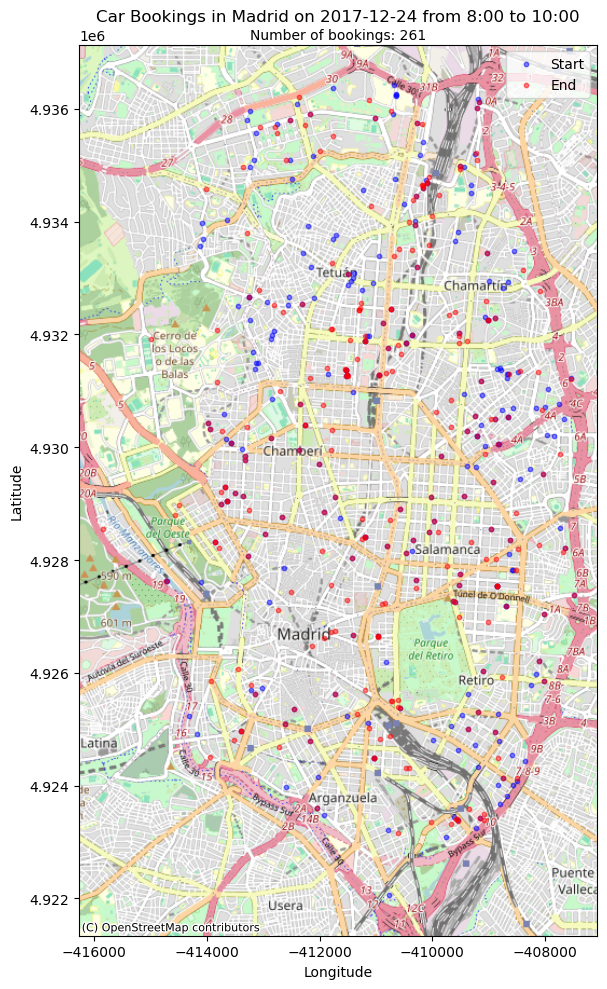

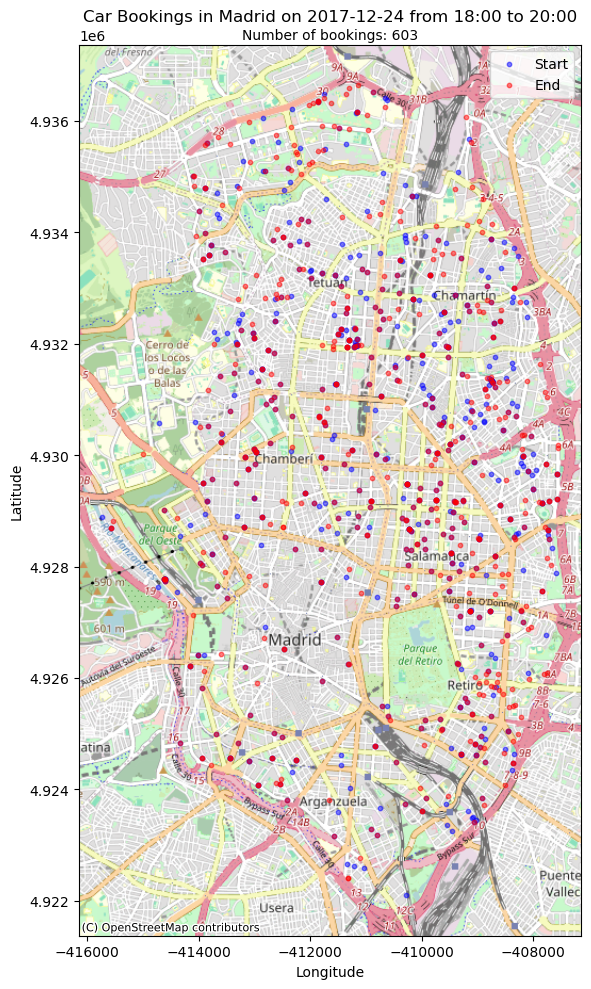

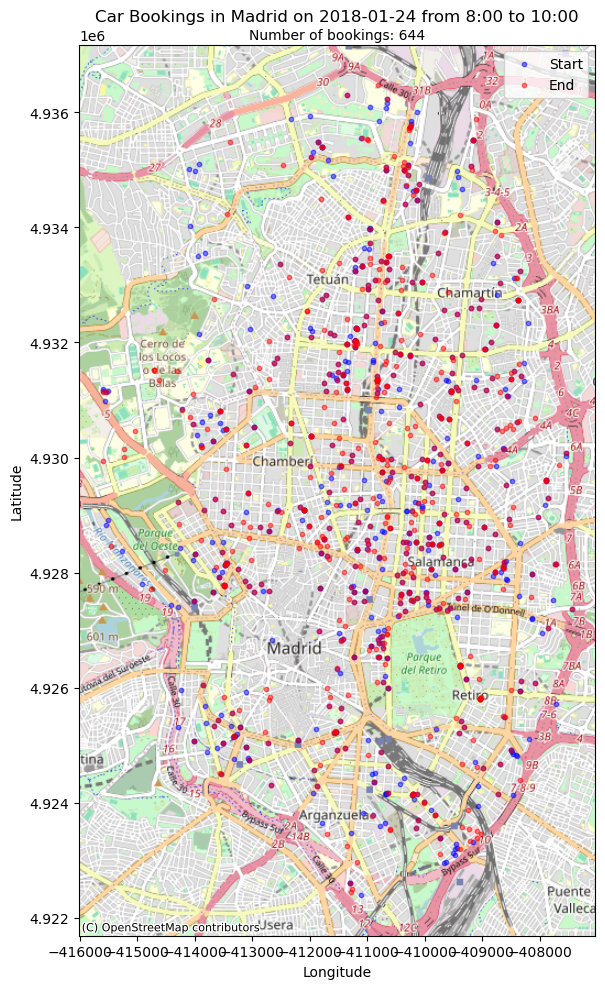

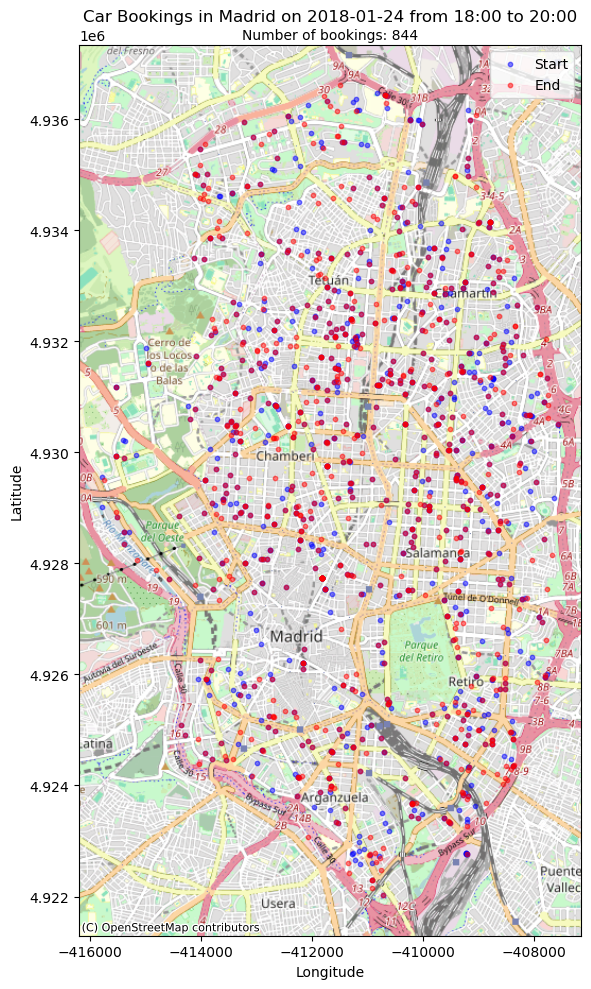

In [6]:
# !pip install contextily

import contextily as ctx
from shapely.geometry import Point

# Filter and plot for each date and time range
for date in dates:
    for hour_start, hour_end in hours:
        start_dt = datetime(date.year, date.month, date.day, hour_start, 0, 0)
        end_dt = datetime(date.year, date.month, date.day, hour_end, 0, 0)
        start_ts = int(start_dt.timestamp())
        end_ts = int(end_dt.timestamp())
        
        # Filter bookings for this specific time range
        filtered_bookings = [b for b in all_bookings if start_ts <= b['init_time'] < end_ts]
        
        if not filtered_bookings:
            print(f"No bookings found for {date.strftime('%Y-%m-%d')} {hour_start}:00-{hour_end}:00")
            continue
        
        # Extract coordinates
        start_lons = [doc['start_lon'] for doc in filtered_bookings]
        start_lats = [doc['start_lat'] for doc in filtered_bookings]
        end_lons = [doc['end_lon'] for doc in filtered_bookings]
        end_lats = [doc['end_lat'] for doc in filtered_bookings]
        
        # Create GeoDataFrame for proper mapping
        start_gdf = gpd.GeoDataFrame(
            geometry=[Point(lon, lat) for lon, lat in zip(start_lons, start_lats)],
            crs='EPSG:4326'
        )
        end_gdf = gpd.GeoDataFrame(
            geometry=[Point(lon, lat) for lon, lat in zip(end_lons, end_lats)],
            crs='EPSG:4326'
        )
        
        # Convert to Web Mercator for basemap
        start_gdf = start_gdf.to_crs(epsg=3857)
        end_gdf = end_gdf.to_crs(epsg=3857)
        
        # Plot
        fig, ax = plt.subplots(figsize=(12, 10))
        
        # Plot start points (blue) and end points (red)
        start_gdf.plot(ax=ax, color='blue', markersize=10, alpha=0.5, label='Start')
        end_gdf.plot(ax=ax, color='red', markersize=10, alpha=0.5, label='End')
        
        # Add basemap
        ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
        
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        ax.set_title(f'Car Bookings in {city} on {date.strftime("%Y-%m-%d")} from {hour_start}:00 to {hour_end}:00')
        ax.legend()

        # add a subtitle indicating the number of bookings
        fig.text(0.5, 0.955, f'Number of bookings: {len(filtered_bookings)}', ha='center', fontsize=10)
        
        plt.tight_layout()
        plt.show()

Choose a proper way to divide the area. Estimate travel demand by computing trip
generation for origin and destination. Plot the results using a heatmap (i.e., assigning a
different colour to each zone to represent the densities of cars).

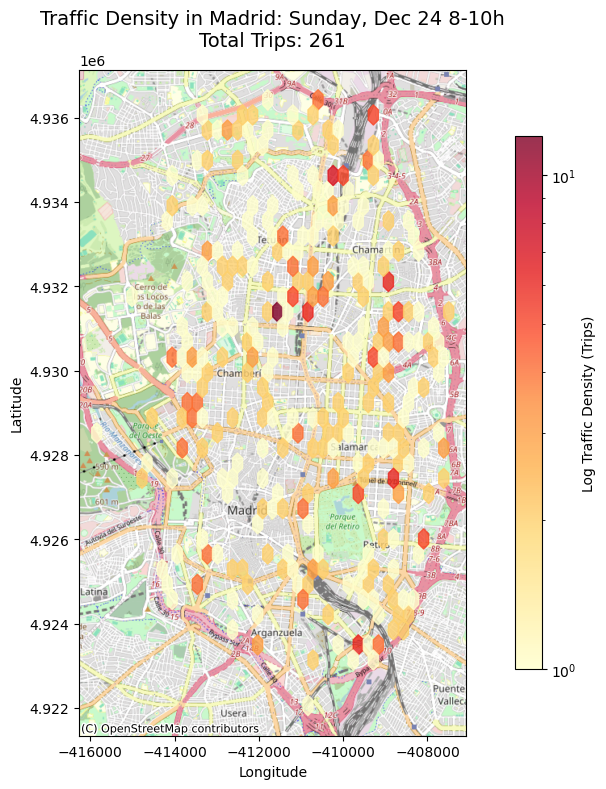

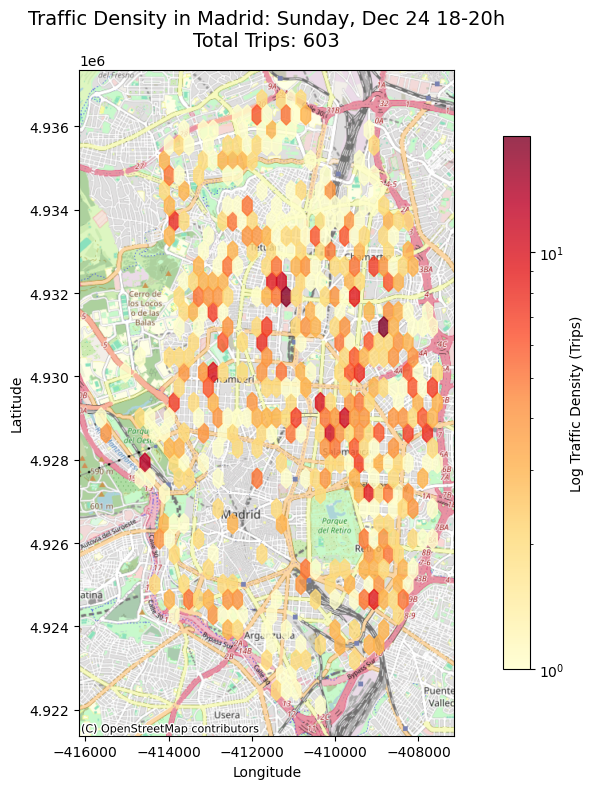

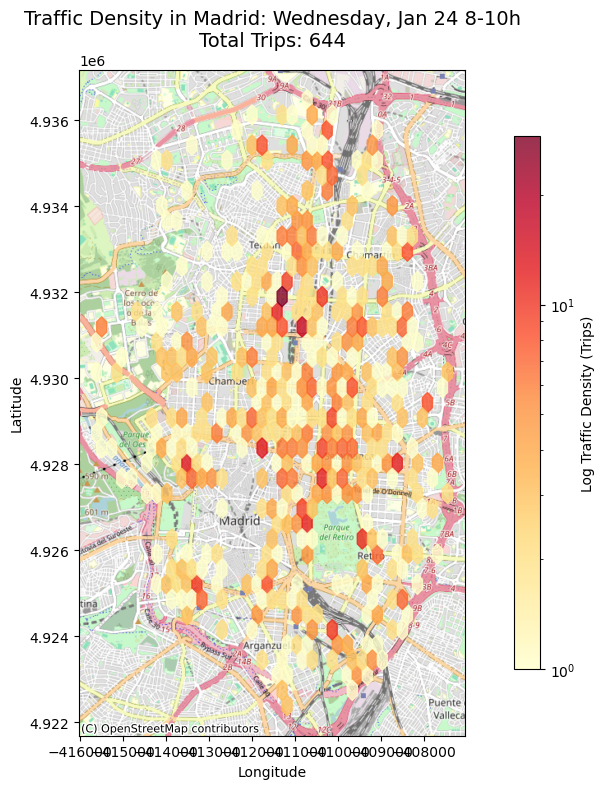

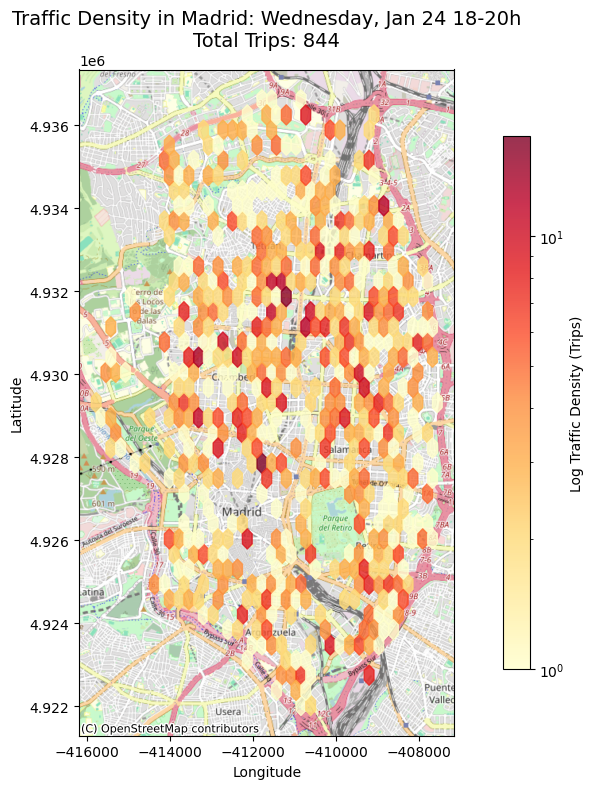

In [17]:
for date in dates:
    for hour_start, hour_end in hours:
        start_date = datetime(date.year, date.month, date.day, hour_start, 0, 0)
        end_date = datetime(date.year, date.month, date.day, hour_end, 0, 0)
        start_ts = int(start_date.timestamp())
        end_ts = int(end_date.timestamp())  

        # filter bookings for this specific time range
        filtered_bookings = [b for b in all_bookings if start_ts <= b['init_time'] < end_ts]

        if not filtered_bookings:
            print(f"No bookings found for {date.strftime('%Y-%m-%d')} {hour_start}:00-{hour_end}:00")
            continue
        
        # Extract coordinates for both origins and destinations
        start_lons = [b['start_lon'] for b in filtered_bookings]
        start_lats = [b['start_lat'] for b in filtered_bookings]
        end_lons = [b['end_lon'] for b in filtered_bookings]
        end_lats = [b['end_lat'] for b in filtered_bookings]

        # Combine all coordinates (origins + destinations)
        all_lons = start_lons + end_lons
        all_lats = start_lats + end_lats
        
        # Create a single GeoDataFrame with all traffic points
        all_gdf = gpd.GeoDataFrame(
            geometry=[Point(lon, lat) for lon, lat in zip(all_lons, all_lats)],
            crs='EPSG:4326'
        ).to_crs(epsg=3857)
        
        # Extract projected coordinates
        all_x = [geom.x for geom in all_gdf.geometry]
        all_y = [geom.y for geom in all_gdf.geometry]
        
        # Create figure with proper aspect ratio
        fig, ax = plt.subplots(figsize=(10, 8))

        # Create hexbin density map for all traffic
        hb = ax.hexbin(all_x, all_y, gridsize=35, cmap='YlOrRd', mincnt=1, bins='log', alpha=0.8)
        
        # Add colorbar
        cb = fig.colorbar(hb, ax=ax, label='Log Traffic Density (Trips)', shrink=0.8)
        
        # Add basemap
        ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
        
        # Set aspect ratio to equal to prevent distortion
        ax.set_aspect('equal')
        
        ax.set_title(f'Traffic Density in {city}: {date.strftime("%A, %b %d")} {hour_start}-{hour_end}h\nTotal Trips: {len(filtered_bookings)}', fontsize=14)
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        
        plt.tight_layout()
        plt.show()


In [ ]:
import contextily as ctx
from shapely.geometry import Point
import matplotlib.pyplot as plt
import geopandas as gpd
# Assuming necessary imports and variables (dates, hours, all_bookings, city, start_lons, end_lons, etc.) are defined

# Filter and plot for each date and time range
for date in dates:
    for hour_start, hour_end in hours:
        start_date = datetime(date.year, date.month, date.day, hour_start, 0, 0)
        end_date = datetime(date.year, date.month, date.day, hour_end, 0, 0)
        start_ts = int(start_date.timestamp())
        end_ts = int(end_date.timestamp())  


        # filter parkings for this specific time range
        filtered_bookings = [b for b in all_bookings if start_ts <= b['init_time'] < end_ts]

        if not filtered_bookings:
            print(f"No bookings found for {date.strftime('%Y-%m-%d')} {hour_start}:00-{hour_end}:00")
            continue
        
        # NOTE: start_lons, end_lons, etc. must be extracted here for the hexbin to work
        # Example extraction (you should have this from previous steps):
        start_lons = [b['start_lon'] for b in filtered_bookings]
        start_lats = [b['start_lat'] for b in filtered_bookings]
        end_lons = [b['end_lon'] for b in filtered_bookings]
        end_lats = [b['end_lat'] for b in filtered_bookings]

        # create GEO dataframe 
        start_gdf = gpd.GeoDataFrame(geometry=[Point(b['start_lon'], b['start_lat']) for b in filtered_bookings],
                                     crs='EPSG:4326')
        
     
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))  

        # Matplotlib hexbin divide the area into hexagonal bins and color them based on the density
        hb1 = ax1.hexbin(start_lons, start_lats, gridsize=50, cmap='Blues', mincnt=1, bins='log', extent=(min(start_lons+end_lons), max(start_lons+end_lons), min(start_lats+end_lats), max(start_lats+end_lats)))

        cb1 = fig.colorbar(hb1, ax=ax1, label='Log of Trip Count (Generation)', shrink=0.8) # Adjusted colorbar size
        
        # Add basemap
        ctx.add_basemap(ax1, source=ctx.providers.OpenStreetMap.Mapnik, crs=start_gdf.crs) 
        ax1.set_title(f'Trip Generation ({date.strftime("%a")} {hour_start}-{hour_end}h)', fontsize=10) # Reduced font size
        ax1.set_xlabel('Longitude', fontsize=9)
        ax1.set_ylabel('Latitude', fontsize=9)
        
        #  Trip Attraction (Destination Density) 
        # NOTE: You used gridsize=30 here and gridsize=50 above. For comparison, it's usually better to keep them the same.
        hb2 = ax2.hexbin(end_lons, end_lats, gridsize=50, cmap='Reds', mincnt=1, bins='log',
                         extent=(min(start_lons+end_lons), max(start_lons+end_lons), min(start_lats+end_lats), max(start_lats+end_lats)))

        # Add colorbar
        cb2 = fig.colorbar(hb2, ax=ax2, label='Log of Trip Count (Attraction)', shrink=0.8) # Adjusted colorbar size
        
        # Add basemap
        ctx.add_basemap(ax2, source=ctx.providers.OpenStreetMap.Mapnik, crs=start_gdf.crs)
        ax2.set_title(f'Trip Attraction ({date.strftime("%a")} {hour_start}-{hour_end}h)', fontsize=10) # Reduced font size
        ax2.set_xlabel('Longitude', fontsize=9)
        # ax2.set_ylabel('Latitude') # Removed duplicate Y-axis label
        
        # Adjusted overall title position and size
        fig.suptitle(f'Demand Analysis for {city} ({date.strftime("%A, %b %d")})', fontsize=12, y=1.00) 
        plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjusted layout to make room for suptitle
        plt.show()